# Download

https://mapreader.readthedocs.io/en/latest/User-guide/Download.html

In [1]:
from mapreader import SheetDownloader

my_ts = SheetDownloader(
    metadata_path="../NLS_metadata/metadata_OS_One_Inch_GB_WFS_light.json",
    download_url="https://geo.nls.uk/maps/os/1inch_2nd_ed/{z}/{x}/{y}.png",
)

[INFO] Metadata file has 480 item(s).


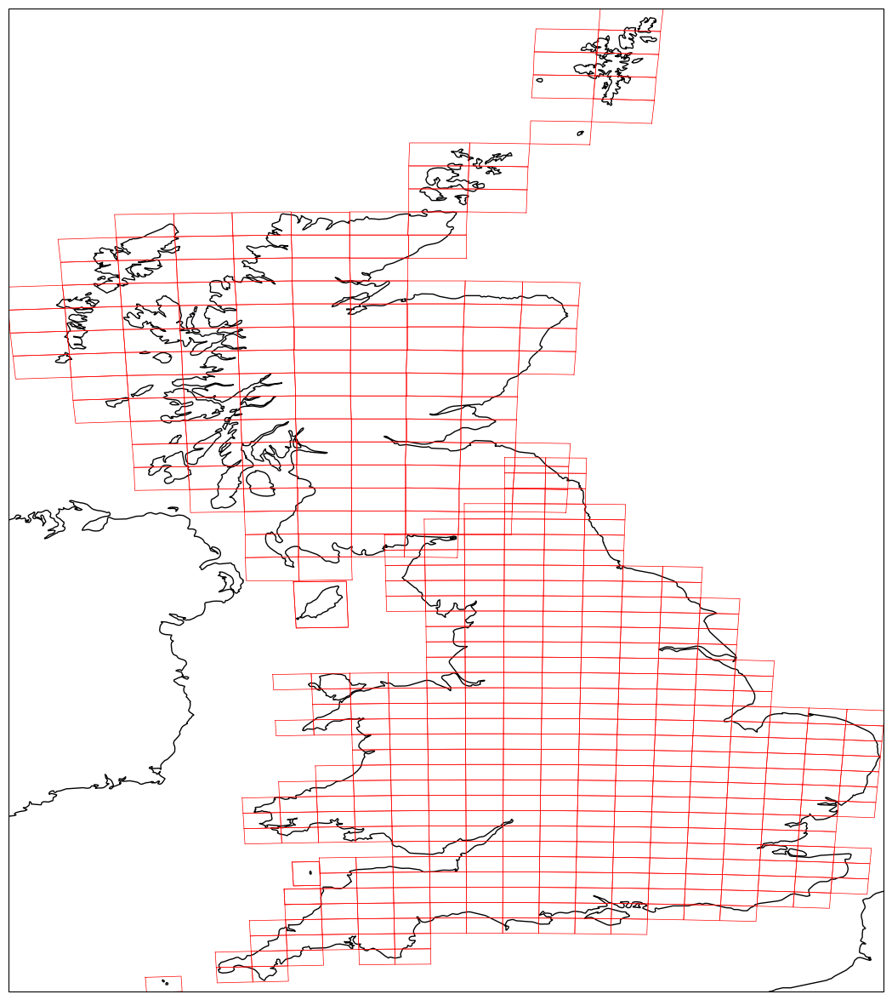

In [2]:
my_ts.extract_wfs_id_nos()
my_ts.plot_all_metadata_on_map(map_extent="uk", add_id=False)

In [3]:
my_ts.get_minmax_latlon()

[INFO] Min lat: 49.82091681, max lat: 60.97000003 
[INFO] Min lon: -8.11999993, max lon: 1.83188116


1873 1909 36


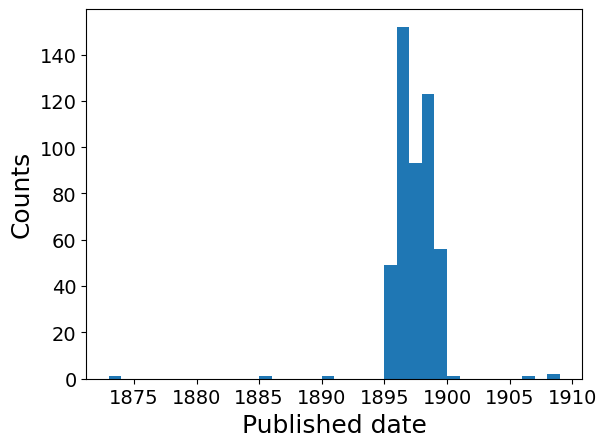

In [4]:
my_ts.extract_published_dates()
my_ts.hist_published_dates()


## Query maps using a list of lats/lons

In [5]:
my_ts.query_map_sheets_by_coordinates((-4.33, 55.90))
my_ts.query_map_sheets_by_coordinates((-3.25, 51.93), append=True)

In [6]:
my_ts.print_found_queries()

Query results:
URL:     	https://maps.nls.uk/view/74488689
coordinates (bounds):  	(-4.82999994, 55.79000003, -4.20999993, 56.05000003)
--------------------
URL:     	https://maps.nls.uk/view/101168342
coordinates (bounds):  	(-3.33544762, 51.87891401, -2.91228731, 52.05404182)
--------------------


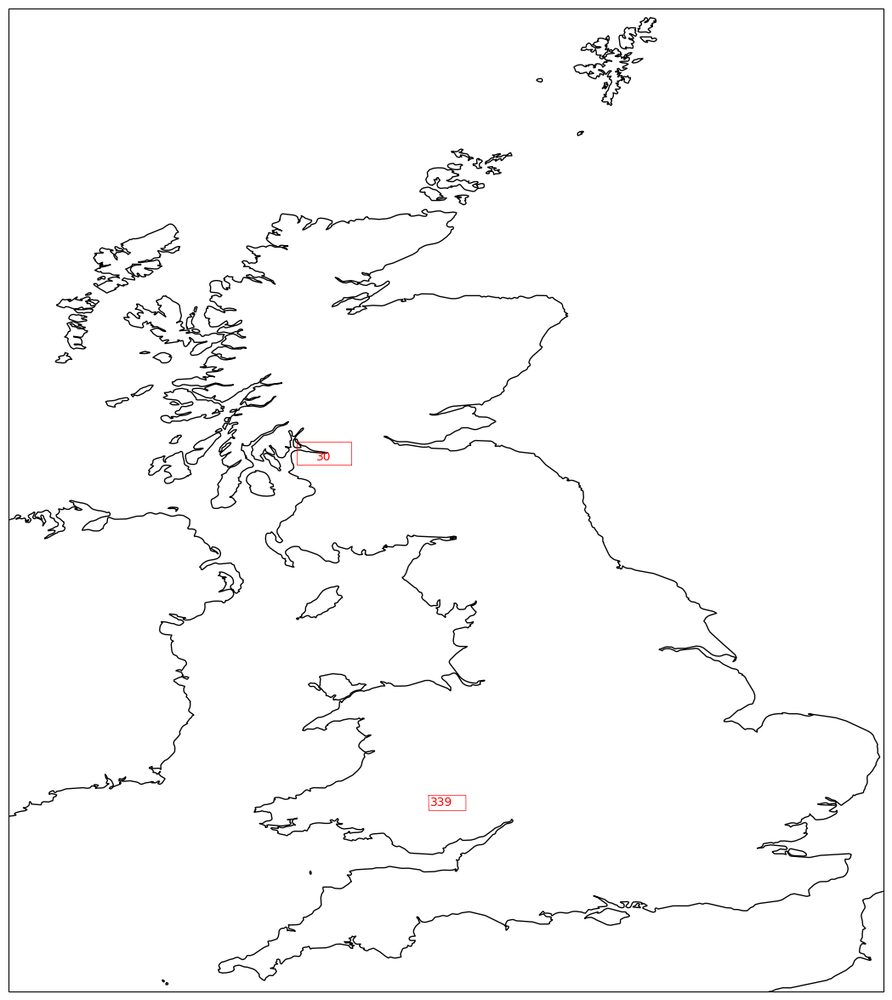

In [7]:
my_ts.plot_queries_on_map(map_extent="uk")

## Download map tiles

In [8]:
my_ts.get_grid_bb(zoom_level=14)
my_ts.download_map_sheets_by_queries(overwrite=True)

  0%|          | 0/2 [00:00<?, ?it/s]

[INFO] Downloaded "map_74488689.png"
[INFO] Downloaded "map_101168342.png"


# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [9]:
from mapreader import loader

In [10]:
my_files = loader("./maps/*png")

  0%|          | 0/2 [00:00<?, ?it/s]

In [11]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [12]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168342.png

#patches: 0



In [13]:
my_files.add_metadata("./maps/metadata.csv")

In [14]:
parent_list = my_files.list_parents()

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 1 Axes>]

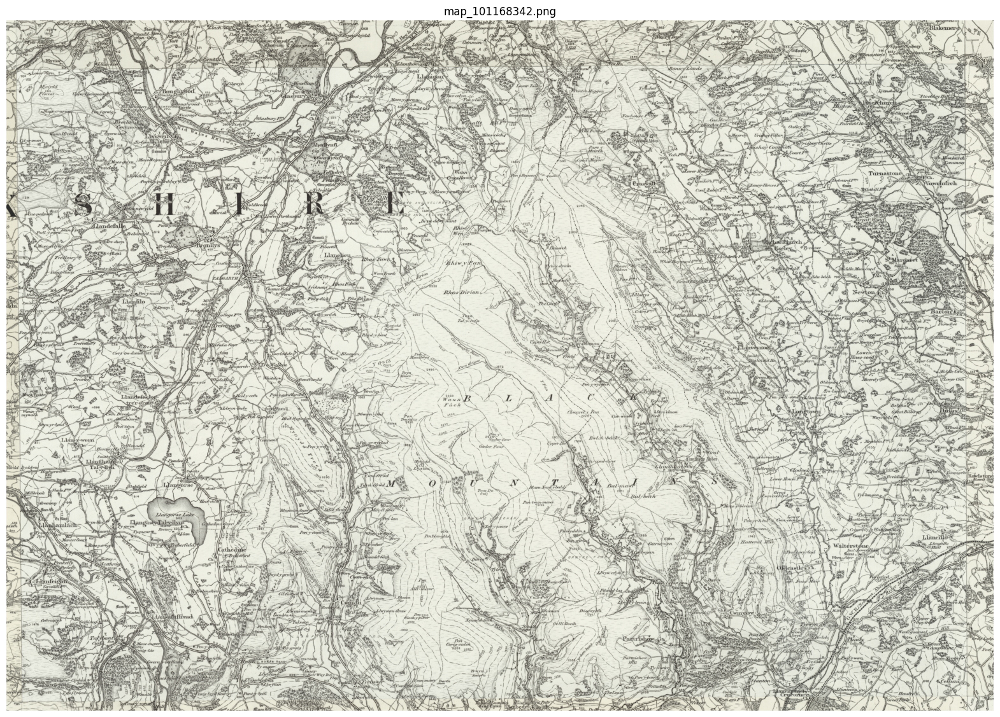

In [15]:
my_files.show(parent_list[1], figsize=(20, 20))

## Patchify maps

In [16]:
my_files.patchify_all(patch_size=100)  # in pixels

[INFO] Saving patches in directory named "patches_100_pixel".


  0%|          | 0/2 [00:00<?, ?it/s]

maps/map_74488689.png
maps/map_101168342.png


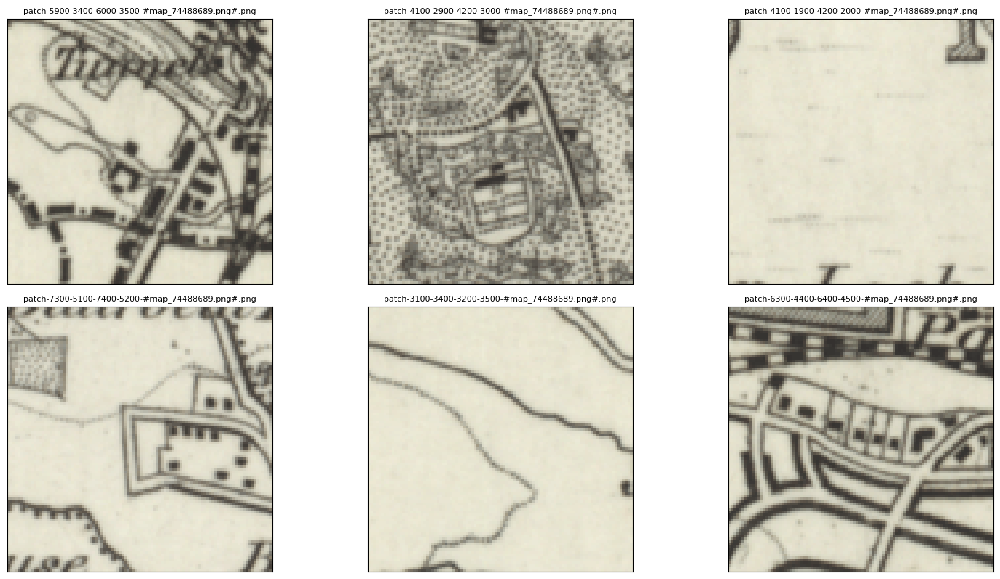

In [17]:
my_files.show_sample(num_samples=6, tree_level="patch")

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 1500x1500 with 1 Axes>]

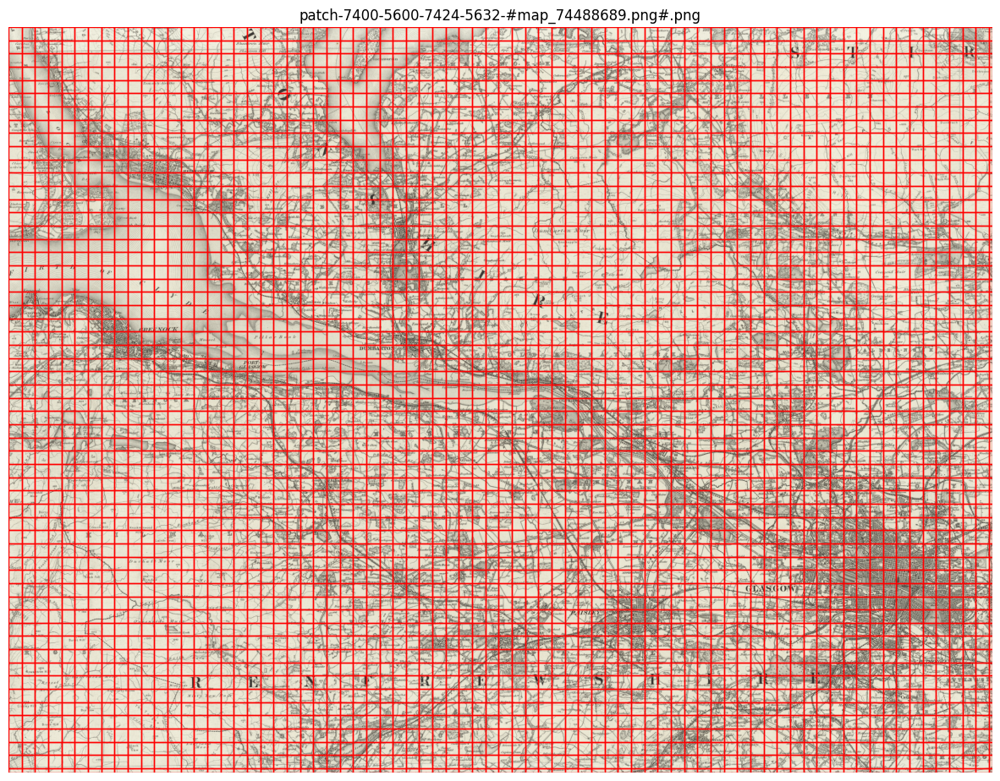

In [18]:
my_files.show_parent(
    parent_list[0], patch_border=True, plot_parent=True, figsize=(15, 15)
)

## Calculate pixel intensities

In [19]:
my_files.calc_pixel_stats()

  0%|          | 0/2 [00:00<?, ?it/s]

In [20]:
parent_df, patch_df = my_files.convert_images(save=True)

[INFO] Saved parent dataframe as "parent_df.csv"
[INFO] Saved patch dataframe as "patch_df.csv"


In [21]:
parent_df.head()

,parent_id,image_path,shape,name,url,coordinates,crs,published_date,grid_bb,patches,dlon,dlat
image_id,,,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(5632, 7424, 4)",map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","[patch-0-0-100-100-#map_74488689.png#.png, pat...",0.000086,0.000048
map_101168342.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3584, 5120, 4)",map_101168342.png,https://maps.nls.uk/view/101168342,"(-3.33984375, 51.87649097061476, -2.900390625,...",EPSG:4326,1896,"[(14, 8040, 5407)x(14, 8059, 5420)]","[patch-0-0-100-100-#map_101168342.png#.png, pa...",0.000086,0.000053


In [22]:
patch_df.head()

,parent_id,image_path,shape,pixel_bounds,coordinates,crs,polygon,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_A
image_id,,,,,,,,,,,,,,,
patch-0-0-100-100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 0, 100, 100)","(-4.833984375, 56.0549605209174, -4.8254013061...",EPSG:4326,"POLYGON ((-4.825401306152344 56.0549605209174,...",0.882480,0.875822,0.814781,1.000000,0.092767,0.095471,0.091923,0.000000
patch-0-100-100-200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 100, 100, 200)","(-4.833984375, 56.050151562728225, -4.82540130...",EPSG:4326,POLYGON ((-4.825401306152344 56.05015156272822...,0.844518,0.836567,0.775709,0.999144,0.122864,0.126680,0.121811,0.020511
patch-0-200-100-300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 200, 100, 300)","(-4.833984375, 56.04534260453906, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04534260453906...,0.795914,0.784561,0.719604,1.000000,0.104913,0.107458,0.103096,0.000000
patch-0-300-100-400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 300, 100, 400)","(-4.833984375, 56.04053364634989, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.04053364634989...,0.736126,0.723507,0.660471,1.000000,0.132483,0.136058,0.130438,0.000000
patch-0-400-100-500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(100, 100, 4)","(0, 400, 100, 500)","(-4.833984375, 56.03572468816073, -4.825401306...",EPSG:4326,POLYGON ((-4.825401306152344 56.03572468816073...,0.783474,0.770846,0.705413,1.000000,0.127172,0.129634,0.123469,0.000000


In [23]:
patch_df.mean()

mean_pixel_R    0.795501
mean_pixel_G    0.787198
mean_pixel_B    0.725992
mean_pixel_A    0.999961
std_pixel_R     0.148580
std_pixel_G     0.151103
std_pixel_B     0.142832
std_pixel_A     0.000813
dtype: float64

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

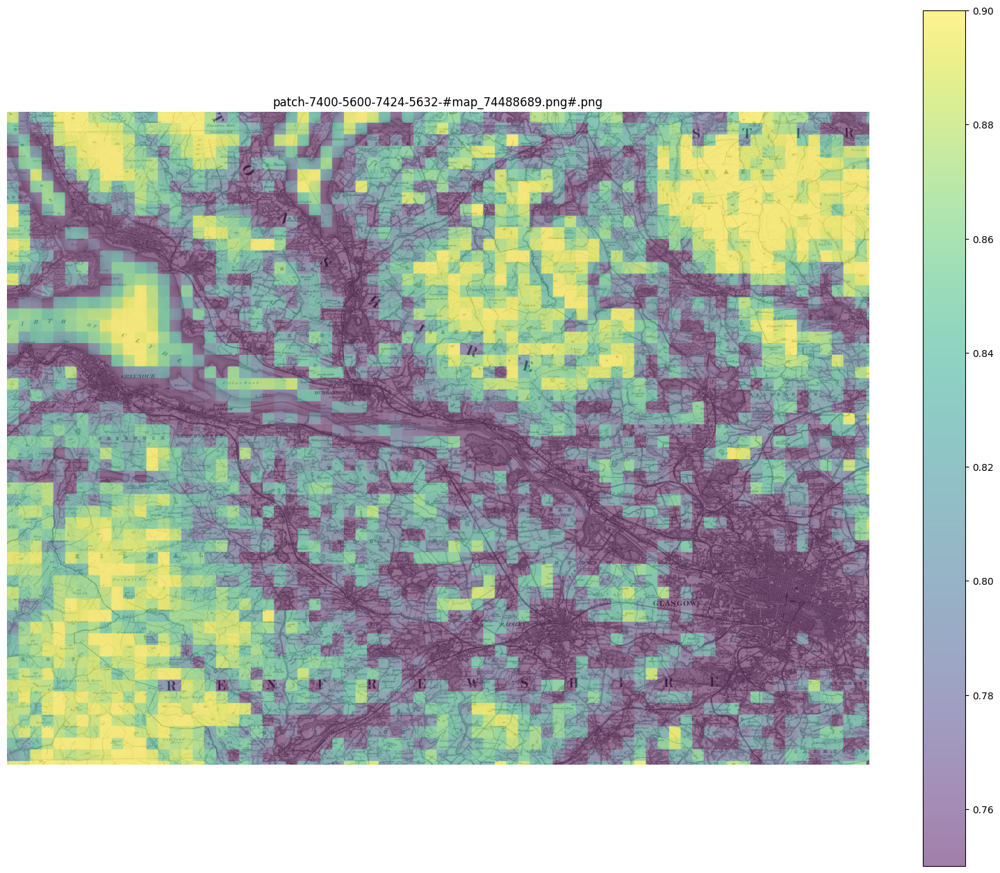

In [24]:
my_files.show_parent(
    parent_list[0],
    column_to_plot="mean_pixel_R",
    patch_border=False,
    plot_parent=True,
    vmin=0.75,
    vmax=0.9,
    figsize=(20, 20),
    alpha=0.5,
)

# Annotate
https://mapreader.readthedocs.io/en/latest/User-guide/Annotate.html

## Set up inputs

In [25]:
from mapreader import Annotator

In [26]:
userID = "rw"
annotation_tasks_file = "./annotation_tasks.yaml"
task = "railspace"
annotation_set = "task_test_one_inch_maps_001"

# sortby="mean" sorts the patches according to the mean pixel intensities
# xoffset and yoffset specify the border size around a patch to be used as the context image (in pixel)
annotator = Annotator(
    "./patch_df.csv",
    "./parent_df.csv",
    labels = ["no", "railspace"],
    annotations_dir="./annotations_one_inch",
    show_context=True,
    username="rosie",
)

In [27]:
annotator.annotate()

Output(layout=Layout(align_items='center', display='flex', flex_flow='column'))

# Train
https://mapreader.readthedocs.io/en/latest/User-guide/Classify.html

## Read annotations

In [28]:
from mapreader import AnnotationsLoader

In [30]:
annotated_images = AnnotationsLoader()

annotated_images.load("./annotations_one_inch/rail_space_#rw#.csv", images_dir="./patches_100_pixel")

[INFO] Reading "./annotations_one_inch/rail_space_#rw#.csv"
[WARNING] 9 files cannot be found.
Check '/Users/rwood/LwM/mapreader/MapReader/worked_examples/geospatial/context_classification_one_inch_maps/broken_paths.txt' for more details and, if possible, update your file paths using the 'images_dir' argument.
[INFO] Annotations with broken file paths have been removed.
Number of annotations remaining: 230
[INFO] Number of annotations:   230

[INFO] Number of instances of each label (from column "label"):
    - no:  176
    - railspace:  54



In [31]:
annotated_images.annotations

,parent_id,image_path,pixel_bounds,label,label_index
image_id,,,,,
patch-2900-1900-3000-2000-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2900, 1900, 3000, 2000)",no,0
patch-6900-4300-7000-4400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6900, 4300, 7000, 4400)",no,0
patch-6600-4200-6700-4300-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6600, 4200, 6700, 4300)",no,0
patch-6600-4100-6700-4200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(6600, 4100, 6700, 4200)",no,0
patch-0-2100-100-2200-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(0, 2100, 100, 2200)",no,0
...,...,...,...,...,...
patch-900-200-1000-300-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(900, 200, 1000, 300)",no,0
patch-3400-5300-3500-5400-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3400, 5300, 3500, 5400)",no,0
patch-2600-2000-2700-2100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2600, 2000, 2700, 2100)",no,0


In [32]:
print(annotated_images)

[INFO] Number of annotations:   230

[INFO] Number of instances of each label (from column "label"):
    - no:  176
    - railspace:  54



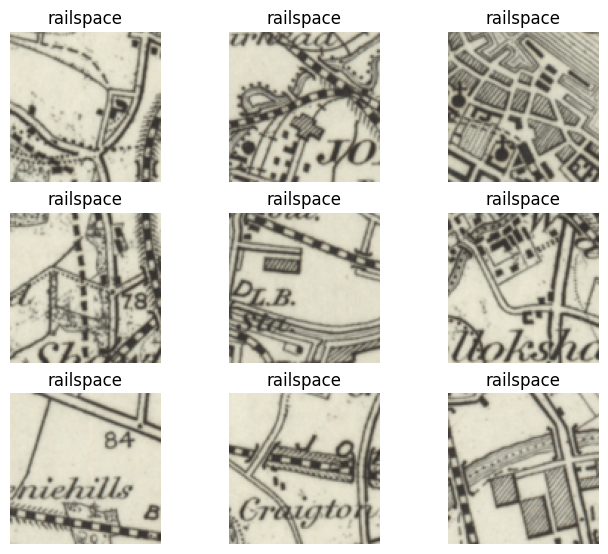

In [33]:
# show sample images for target label (tar_label)
annotated_images.show_sample(label_to_show="railspace")

## Prepare datasets and dataloaders

In [34]:
annotated_images.create_datasets(frac_train=0.7, frac_val=0.2, frac_test=0.1, context_datasets=True, context_df= "./patch_df.csv")

[INFO] Number of annotations in each set:
    - train:   161
    - val:   46
    - test:   23


In [35]:
annotated_images.datasets["train"].patch_df.head()

,parent_id,image_path,pixel_bounds,label,label_index
image_id,,,,,
patch-1600-100-1700-200-#map_101168342.png#.png,map_101168342.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(1600, 100, 1700, 200)",no,0
patch-3300-2600-3400-2700-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3300, 2600, 3400, 2700)",no,0
patch-3500-4000-3600-4100-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(3500, 4000, 3600, 4100)",no,0
patch-2800-1400-2900-1500-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2800, 1400, 2900, 1500)",no,0
patch-2800-600-2900-700-#map_74488689.png#.png,map_74488689.png,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,"(2800, 600, 2900, 700)",no,0


In [36]:
annotated_images.labels_map

{0: 'no', 1: 'railspace'}

In [37]:
dataloaders = annotated_images.create_dataloaders(batch_size=8)

[INFO] Using default sampler.


## Set up `ClassifierContainer`

### Load a pretrained PyTorch model, dataloaders and labels map

In [38]:
from mapreader import ClassifierContainer

In [39]:
my_classifier = ClassifierContainer(model ="resnet18",
                                    labels_map={0: 'No', 1: 'railspace'},
                                    dataloaders=dataloaders,
                                    )

[INFO] Device is set to cpu
[INFO] Initializing model.
[INFO] Loaded "train" with 161 items.
[INFO] Loaded "val" with 46 items.
[INFO] Loaded "test" with 23 items.


In [40]:
my_classifier.labels_map

{0: 'No', 1: 'railspace'}

[INFO] dataset: train
        - items:        161
        - batch size:   8
        - batches:      21


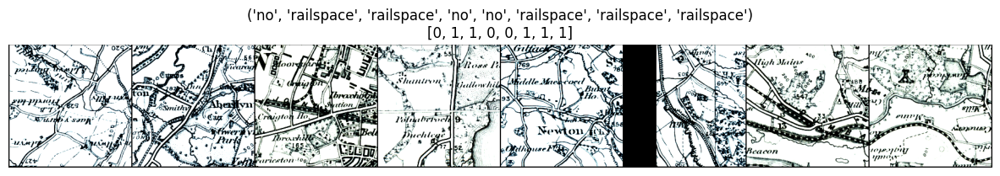

In [41]:
my_classifier.show_sample(set_name="train", batch_number=1)

In [42]:
my_classifier.model_summary()

Layer (type:depth-idx)                   Output Shape              Output Shape              Param #
ResNet                                   [8, 2]                    [8, 2]                    --
├─Conv2d: 1-1                            [8, 64, 112, 112]         [8, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]         [8, 64, 112, 112]         128
├─ReLU: 1-3                              [8, 64, 112, 112]         [8, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [8, 64, 56, 56]           [8, 64, 56, 56]           --
├─Sequential: 1-5                        [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]           [8, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]           [8, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]           [8, 64, 56, 56]           128
│    │    └─ReLU: 3-3     

### Set up criterion, optimizer and scheduler

In [43]:
my_classifier.add_criterion("cross-entropy")

[INFO] Using "CrossEntropyLoss()" as criterion.


In [44]:
params_to_optimize = my_classifier.generate_layerwise_lrs(
    min_lr=1e-4, max_lr=1e-3, spacing="geomspace"
)

In [45]:
my_classifier.initialize_optimizer(params2optimize=params_to_optimize)

In [46]:
my_classifier.initialize_scheduler()

## Train/fine-tune model

**Note:** it is possible to interrupt a training (using Kernel/Interrupt in Jupyter Notebook or ctrl+C). 

In [47]:
my_classifier.train(
    num_epochs=30,
    save_model_dir="./models_tutorial",
    tensorboard_path="tboard_tutorial",
    tmp_file_save_freq=5,
    remove_after_load=False,
    print_info_batch_freq=10,
)

[INFO] Each step will pass: ['train', 'val'].
2024-02-22 09:05:48 599-JY5FK6 [INFO] train    -- 1/30 --      8/161 (  5.0% ) -- Loss: 1.241
2024-02-22 09:05:54 599-JY5FK6 [INFO] train    -- 1/30 --     88/161 ( 54.7% ) -- Loss: 0.568
2024-02-22 09:05:59 599-JY5FK6 [INFO] train    -- 1/30 --    161/161 (100.0% ) -- Loss: 0.210
2024-02-22 09:05:59 599-JY5FK6 [INFO] train    -- 1/30 -- Loss: 1.059; F_macro: 57.12; R_macro: 57.18
2024-02-22 09:05:59 599-JY5FK6 [INFO] val      -- 1/30 --       8/46 ( 17.4% ) -- Loss: 5.557
2024-02-22 09:06:01 599-JY5FK6 [INFO] val      -- 1/30 -- Loss: 7.365; F_macro: 51.35; R_macro: 62.34

2024-02-22 09:06:02 599-JY5FK6 [INFO] train    -- 2/30 --      8/161 (  5.0% ) -- Loss: 0.622
2024-02-22 09:06:07 599-JY5FK6 [INFO] train    -- 2/30 --     88/161 ( 54.7% ) -- Loss: 0.761
2024-02-22 09:06:12 599-JY5FK6 [INFO] train    -- 2/30 --    161/161 (100.0% ) -- Loss: 0.815
2024-02-22 09:06:12 599-JY5FK6 [INFO] train    -- 2/30 -- Loss: 0.747; F_macro: 57.97; R_ma

In [48]:
list(my_classifier.metrics.keys())

['epoch_loss_train',
 'epoch_prec_micro_train',
 'epoch_recall_micro_train',
 'epoch_fscore_micro_train',
 'epoch_supp_micro_train',
 'epoch_rocauc_micro_train',
 'epoch_prec_macro_train',
 'epoch_recall_macro_train',
 'epoch_fscore_macro_train',
 'epoch_supp_macro_train',
 'epoch_rocauc_macro_train',
 'epoch_prec_weighted_train',
 'epoch_recall_weighted_train',
 'epoch_fscore_weighted_train',
 'epoch_supp_weighted_train',
 'epoch_rocauc_weighted_train',
 'epoch_prec_0_train',
 'epoch_recall_0_train',
 'epoch_fscore_0_train',
 'epoch_supp_0_train',
 'epoch_prec_1_train',
 'epoch_recall_1_train',
 'epoch_fscore_1_train',
 'epoch_supp_1_train',
 'epoch_loss_val',
 'epoch_prec_micro_val',
 'epoch_recall_micro_val',
 'epoch_fscore_micro_val',
 'epoch_supp_micro_val',
 'epoch_rocauc_micro_val',
 'epoch_prec_macro_val',
 'epoch_recall_macro_val',
 'epoch_fscore_macro_val',
 'epoch_supp_macro_val',
 'epoch_rocauc_macro_val',
 'epoch_prec_weighted_val',
 'epoch_recall_weighted_val',
 'epoch_fs

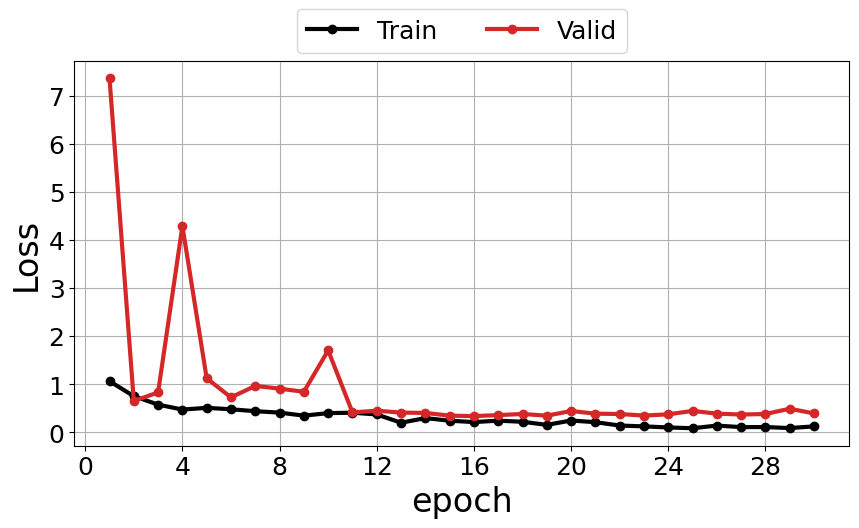

In [49]:
my_classifier.plot_metric(
    y_axis=["epoch_loss_train", "epoch_loss_val"],
    y_label="Loss",
    legends=["Train", "Valid"],
)

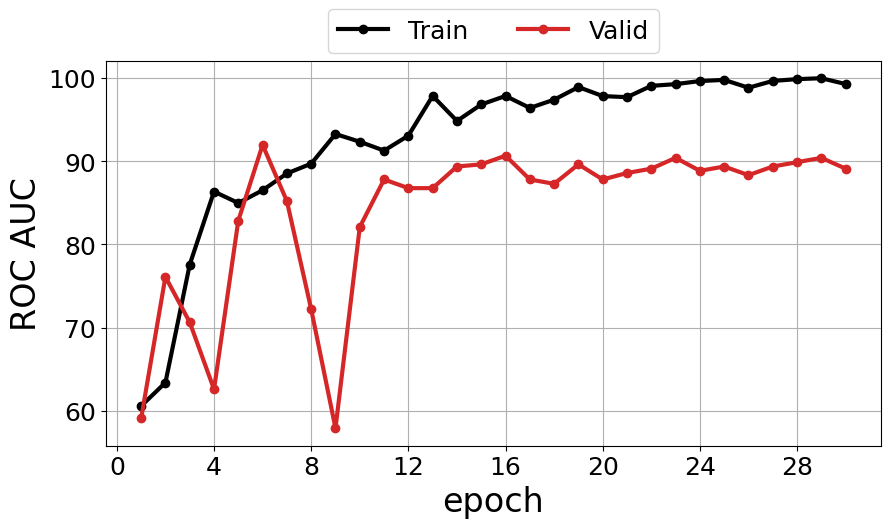

In [50]:
my_classifier.plot_metric(
    y_axis=["epoch_rocauc_macro_train", "epoch_rocauc_macro_val"],
    y_label="ROC AUC",
    legends=["Train", "Valid"],
    colors=["k", "tab:red"],
)

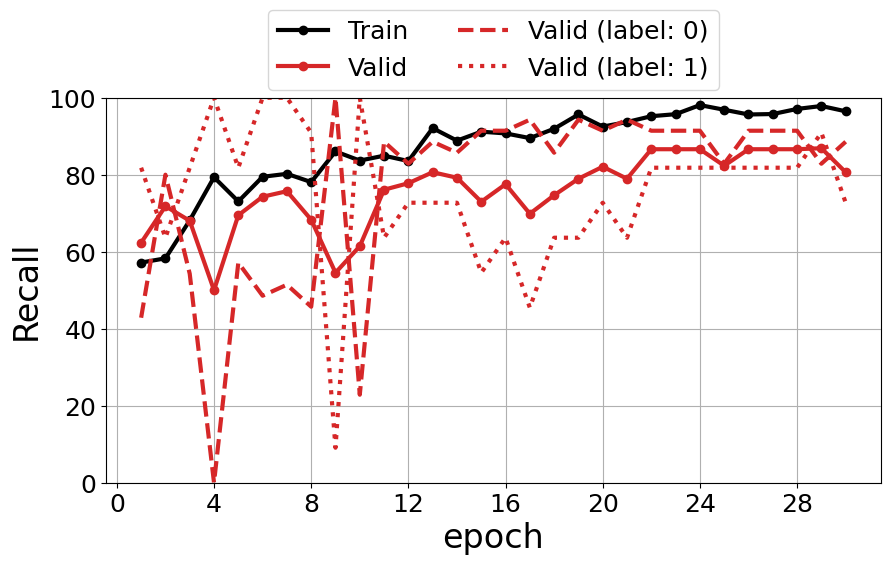

In [51]:
my_classifier.plot_metric(
    y_axis=[
        "epoch_recall_macro_train",
        "epoch_recall_macro_val",
        "epoch_recall_0_val",
        "epoch_recall_1_val",
    ],
    y_label="Recall",
    legends=[
        "Train",
        "Valid",
        "Valid (label: 0)",
        "Valid (label: 1)",
    ],
    colors=["k", "tab:red", "tab:red", "tab:red"],
    styles=["-", "-", "--", ":"],
    markers=["o", "o", "", ""],
    plt_yrange=[0, 100],
)

# Model inference

Here, we show how to load an already trained/fine-tuned model and a dataset and then do model inference.

## Load patches and add metadata

In [52]:
from mapreader import load_patches

In [53]:
my_maps = load_patches(
    "./patches_100_pixel/*74488689*png", parent_paths="./maps/map_74488689.png"
)

my_maps.add_metadata("./maps/metadata.csv", ignore_mismatch=True)
my_maps.add_metadata("patch_df.csv", tree_level="patch", ignore_mismatch=True)

0it [00:00, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/4275 [00:00<?, ?it/s]

In [54]:
parent_df, patch_df = my_maps.convert_images()

## Create dataset from patches

In [55]:
from mapreader import PatchContextDataset

In [56]:
patch_dataset = PatchContextDataset(patch_df, total_df=patch_df, transform="val", create_context=True)

In [57]:
my_classifier.load_dataset(
    patch_dataset, set_name="patches", batch_size=8, shuffle=False
)

In [58]:
my_classifier.print_batch_info(set_name="patches")

[INFO] dataset: patches
        - items:        4275
        - batch size:   8
        - batches:      535



## Inference

In [59]:
my_classifier.inference(set_name="patches")

[INFO] Each step will pass: ['patches'].
2024-02-22 09:12:50 599-JY5FK6 [INFO] patches  -- 31/31 --     8/4275 (  0.2% ) -- 
2024-02-22 09:12:52 599-JY5FK6 [INFO] patches  -- 31/31 --    48/4275 (  1.1% ) -- 
2024-02-22 09:12:54 599-JY5FK6 [INFO] patches  -- 31/31 --    88/4275 (  2.1% ) -- 
2024-02-22 09:12:56 599-JY5FK6 [INFO] patches  -- 31/31 --   128/4275 (  3.0% ) -- 
2024-02-22 09:12:58 599-JY5FK6 [INFO] patches  -- 31/31 --   168/4275 (  3.9% ) -- 
2024-02-22 09:12:59 599-JY5FK6 [INFO] patches  -- 31/31 --   208/4275 (  4.9% ) -- 
2024-02-22 09:13:01 599-JY5FK6 [INFO] patches  -- 31/31 --   248/4275 (  5.8% ) -- 
2024-02-22 09:13:03 599-JY5FK6 [INFO] patches  -- 31/31 --   288/4275 (  6.7% ) -- 
2024-02-22 09:13:05 599-JY5FK6 [INFO] patches  -- 31/31 --   328/4275 (  7.7% ) -- 
2024-02-22 09:13:07 599-JY5FK6 [INFO] patches  -- 31/31 --   368/4275 (  8.6% ) -- 
2024-02-22 09:13:08 599-JY5FK6 [INFO] patches  -- 31/31 --   408/4275 (  9.5% ) -- 
2024-02-22 09:13:10 599-JY5FK6 [INF

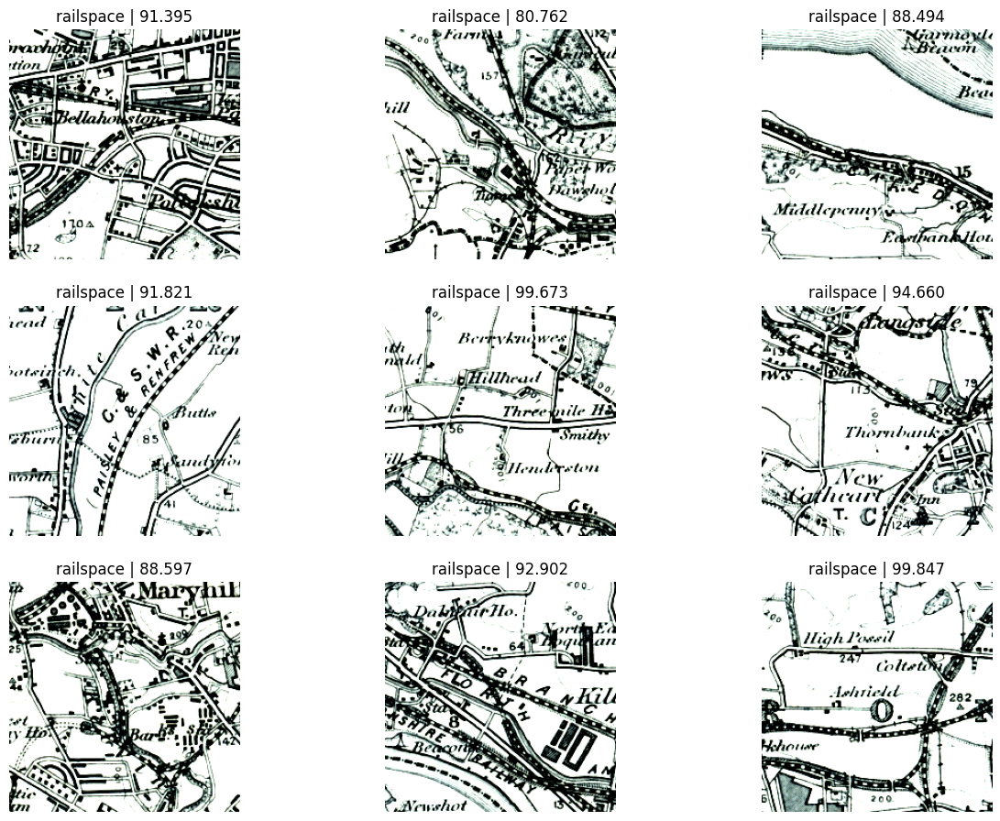

In [60]:
my_classifier.show_inference_sample_results(
    label="railspace", num_samples=9, set_name="patches", min_conf=80
)

### Save predictions

In [61]:
my_classifier.save_predictions("patches")

[INFO] Saved predictions to patches_predictions_patch_df.csv.


## Add outputs to `MapImages` as metadata

In [62]:
my_maps.add_metadata("./patches_predictions_patch_df.csv", tree_level="patch")

In [63]:
my_maps.add_shape()

[INFO] Add shape, tree level: parent


In [64]:
parent_df, patch_df = my_maps.convert_images()
parent_df.head()

,parent_id,image_path,patches,name,url,coordinates,crs,published_date,grid_bb,shape
image_id,,,,,,,,,,
map_74488689.png,None,/Users/rwood/LwM/mapreader/MapReader/worked_ex...,[patch-4800-4700-4900-4800-#map_74488689.png#....,map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, 55.78892895389263, -4.196777343...",EPSG:4326,1898,"[(14, 7972, 5097)x(14, 8000, 5118)]","(5632, 7424, 4)"


  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

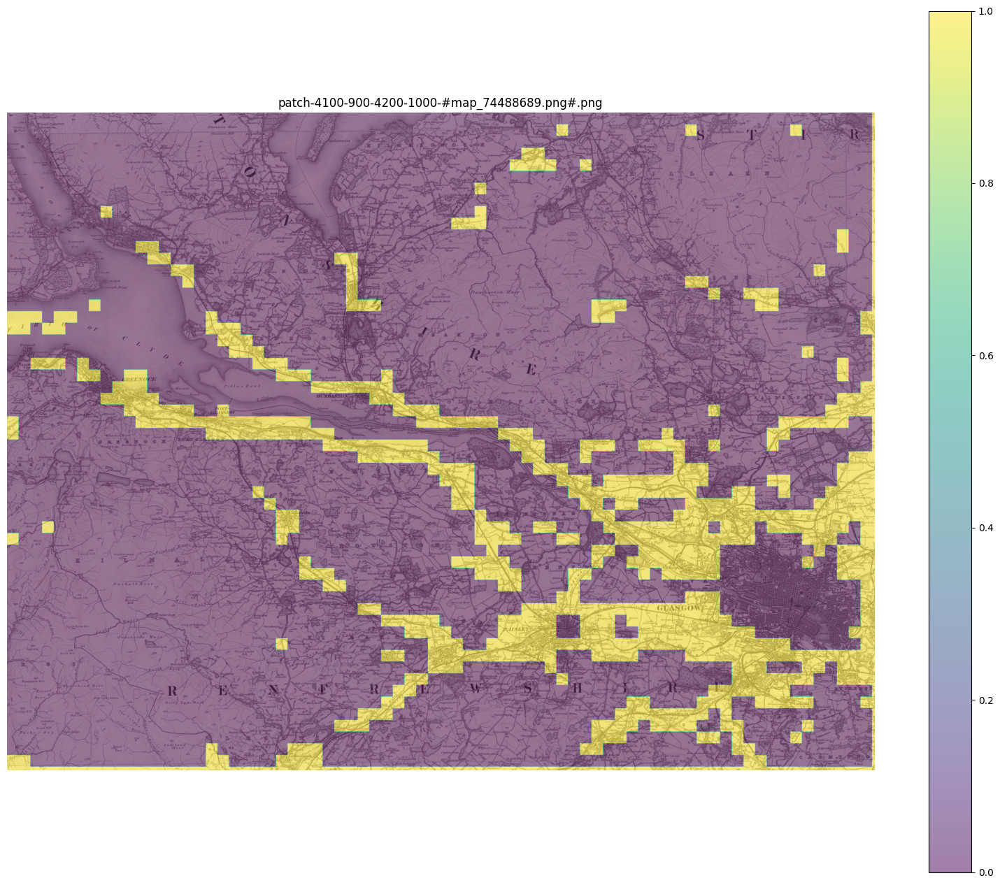

In [65]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="pred",
    patch_border=False,
    plot_parent=True,
    figsize=(20,20),
    alpha=0.5,
)

  0%|          | 0/1 [00:00<?, ?it/s]

[<Figure size 2000x2000 with 2 Axes>]

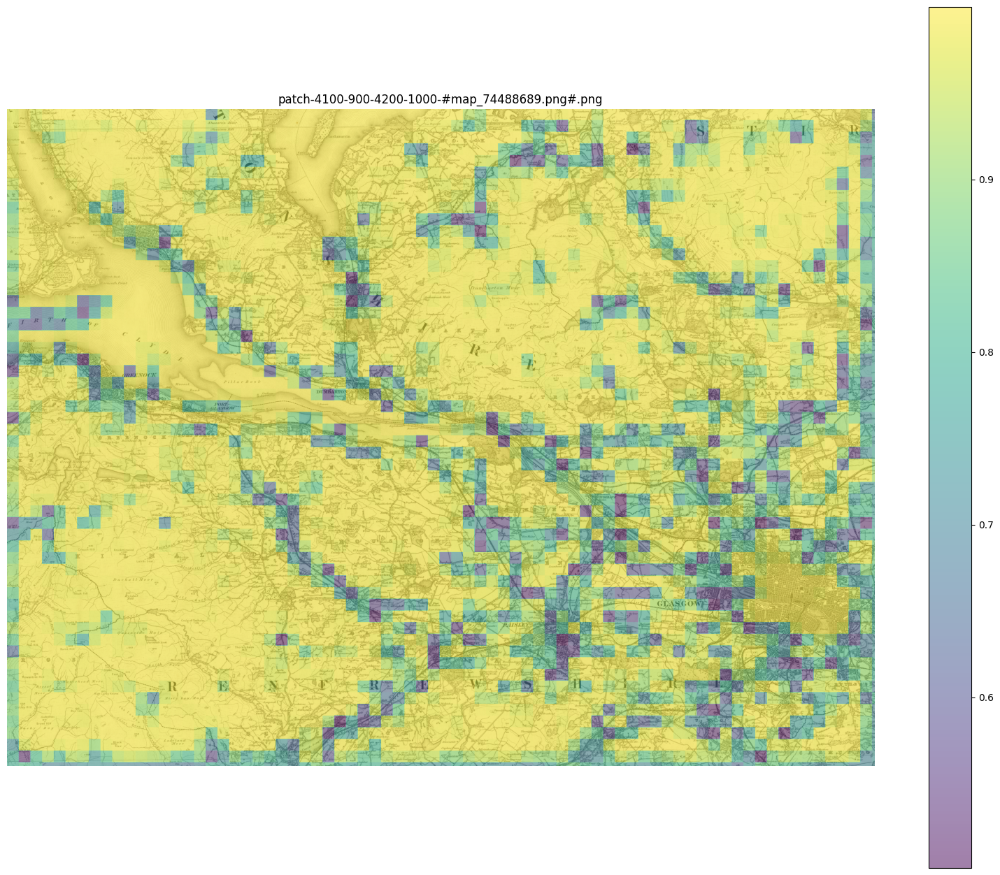

In [66]:
parent_list = my_maps.list_parents()

my_maps.show_parent(
    parent_list[0],
    column_to_plot="conf",
    patch_border=False,
    plot_parent=True,
    figsize=(20,20),
    alpha=0.5,
)